# 1.Import libraries

In [1]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.2 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.2/107.7 GB disk)


In [2]:
%pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 12.4 MB/s eta 0:00:00


In [3]:
import os
import numpy as np
import timm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import models
from torchvision import transforms
from PIL import Image

from ultralytics import YOLO

In [14]:
!unzip -q icdar2003.zip

# 2. Load model

## 2.1. Load YOLO

In [4]:
text_det_model_path = './yolov8_best.pt'
yolo = YOLO(text_det_model_path)

## 2.2. Load CRNN Resnet

In [5]:
chars = '0123456789abcdefghijklmnopqrstuvwxyz-'
vocab_size = len(chars)
char_to_idx = {char: idx + 1 for idx, char in enumerate(sorted(chars))}
idx_to_char = {idx: char for char, idx in char_to_idx.items()}

In [6]:
class CRNN_Resnet (nn.Module):
    def __init__ (
        self,
        vocab_size,
        hidden_size,
        n_layers,
        dropout=0.2,
        unfreeze_layers=3
    ):
        super (CRNN_Resnet, self).__init__()

        # Initialize pretrained model resnet 101
        backbone = timm.create_model (
            'resnet101',
            in_chans=1,
            pretrained=True
        )

        # Remove original classifier layer
        modules = list(backbone.children())[:-2]

        # Add an Adaptive Average Pooling layer
        modules.append(nn.AdaptiveAvgPool2d((1, None)))
        self.backbone = nn.Sequential(*modules)

        # Unfreeze some last layers of pretrained model
        for parameter in self.backbone[-unfreeze_layers:].parameters():
            parameter.require_grad = True

        # Layer to map feature maps of CNN to LSTM
        self.mapSeq = nn.Sequential (
            nn.Linear (2048, 1024),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.lstm = nn.LSTM (
            1024, hidden_size,
            n_layers,
            bidirectional=True,
            batch_first=True,
            dropout=dropout if n_layers > 1 else 0
        )
        self.layer_norm = nn.LayerNorm(hidden_size*2)
        self.out = nn.Sequential (
            nn.Linear (hidden_size*2, vocab_size),
            nn.LogSoftmax(dim=2)
        )

    def forward(self, x):
        x = self.backbone(x) # shape: (bs, c, h, w)
        x = x.permute(0, 3, 1, 2) # shape: (bs, w, c, h)
        x = x.view(x.size(0), x.size(1), -1)  # Remove h: (bs, w, c)
        x = self.mapSeq(x)
        x, _ = self.lstm(x)
        x = self.layer_norm(x)
        x = self.out(x) # shape: (bs, seq_len, n_classes)
        x = x.permute(1, 0, 2) # Based on CTC # (seq_len, bs, n_classes)

        return x

In [20]:
hidden_size = 256
n_layers = 2
dropout_prob = 0.3
unfreeze_layers=3
device = 'cuda' if torch.cuda.is_available() else 'cpu'
crnn_resnet_model_path = './crnn_resnet_best.pt'

crnn_resnet_model = CRNN_Resnet(
    vocab_size=vocab_size,
    hidden_size=hidden_size,
    n_layers=n_layers,
    dropout=dropout_prob,
    unfreeze_layers=unfreeze_layers
).to(device)
crnn_resnet_model.load_state_dict(torch.load(crnn_resnet_model_path, map_location=torch.device('cpu')))

<All keys matched successfully>

# 3. Inference

In [7]:
def decode (encoded_sequences, idx_to_char, blank_char='-'):
  """
  Decode encoded label into string

  Parameters:
    encoded_sequences (list): List of tensor label.
    idx_to_char (dict): mapping ID -> classname.
    blank_char (str): character for blank.

    Returns:
      decoded_sequences (list): list of labels that have been decoded
  """

  # Initialize empty list to store decode results
  decoded_sequences = []

  # Loop through each encoded label
  for seq in encoded_sequences:
    # Declare empty list to store decoded character
    decoded_label = []
    # Loop through each token
    for idx, token in enumerate(seq):
      # Skip padding token (ID=0)
      if token != 0:
        char = idx_to_char[token.item()]
        # Skip blank token
        if char != blank_char:
          decoded_label.append(char)
    decoded_sequences.append(''.join(decoded_label))

  return decoded_sequences

In [8]:
def text_detection(img_path, text_det_model):
  """
  Identify bounding box of text in image.

  Parameters:
    img_pth (str): Path to the image file.
    text_det_model (YOLO): Model YOLO text detection.

  Returns:
    tuple: Including identified components (bounding boxes, classes, names, confident score)
  """
  text_det_results = text_det_model (img_path, verbose=False)[0]

  # Get information of bounding boxes (format xyxy)
  bboxes = text_det_results.boxes.xyxy.tolist()
  # Get classes name, confident score
  classes = text_det_results.boxes.cls.tolist()
  names = text_det_results.names
  confs = text_det_results.boxes.conf.tolist()

  return bboxes, classes, names, confs

In [9]:
def text_recognition(img, data_transforms, text_reg_model, idx_to_char, device):
    """
    Recognize text in image.

    Parameters:
        img (PIL.Image): Image object.
        data_transforms (transforms.Compose): Image pre-processing function
        text_reg_model (CRNN): Model CRNN for text recognition.
        idx_to_char (dict): Mapping ID->classname.
        device (str): 'cpu' or 'gpu'.

    Returns:
        text (str): Recognized text
    """
    transformed_image = data_transforms(img)
    transformed_image = transformed_image.unsqueeze(0).to(device)
    text_reg_model.eval()
    with torch.no_grad():
        logits = text_reg_model(transformed_image).detach().cpu()
    text = decode(logits.permute(1, 0, 2).argmax(2), idx_to_char)

    return text

In [10]:
def visualize_detections (img, detections):
  """
  Visualize results for Scene Text Recognition (STR).

  Parameters:
    img (PIL.Image): Image object.
    detections (list): List of STR on image
  """

  plt.figure(figsize= (12,8))
  plt.imshow (img)
  plt.axis('off')

  # Loop through each (bbox, classname, conf, text)
  for bbox, detected_class, confidence, transcribed_text in detections:
    x1, y1, x2, y2 = bbox
    # Visualize detected bounding box and recognized text
    plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='red', linewidth=2))
    plt.text (
        x1, y1 - 10, f"{detected_class} ({confidence:.2f}) {transcribed_text}",
        fontsize=9, bbox=dict(facecolor='red', alpha=0.5)
    )
  plt.show()

In [11]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((100, 420)),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
        transforms.Grayscale(num_output_channels=1),
        transforms.GaussianBlur(3),
        transforms.RandomAffine(degrees=1, shear=1),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.3, interpolation=3),
        transforms.RandomRotation(degrees=2),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,)),
    ]),
    'val': transforms.Compose([
        transforms.Resize((100, 420)),
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,)),
    ]),
}

In [12]:
def predict(img_path, data_transforms, text_det_model, text_reg_model, idx_to_char, device, visualize=True):
    """
    Perform Scene Text Recognition on any image.

    Returns:
        predictions (list): List of STR results on image.
    """
    # Text detection
    bboxes, classes, names, confs = text_detection(img_path, text_det_model)

    # Load image
    img = Image.open(img_path)

    # Initialize empty list to store STR results
    predictions = []

    # Loop through each detection result
    for bbox, cls, conf in zip(bboxes, classes, confs):
        x1, y1, x2, y2 = bbox
        confidence = conf
        detected_class = cls
        name = names[int(cls)]

        # Crop image by bboxes
        cropped_image = img.crop((x1, y1, x2, y2))

        # Perform text recognition on cropped image
        transcribed_text = text_recognition(
            cropped_image,
            data_transforms,
            text_reg_model,
            idx_to_char,
            device
        )

        # Add STR results to list predictions
        predictions.append((bbox, name, confidence, transcribed_text))

    # Perform visualization
    if visualize:
        visualize_detections(img, predictions)

    return predictions

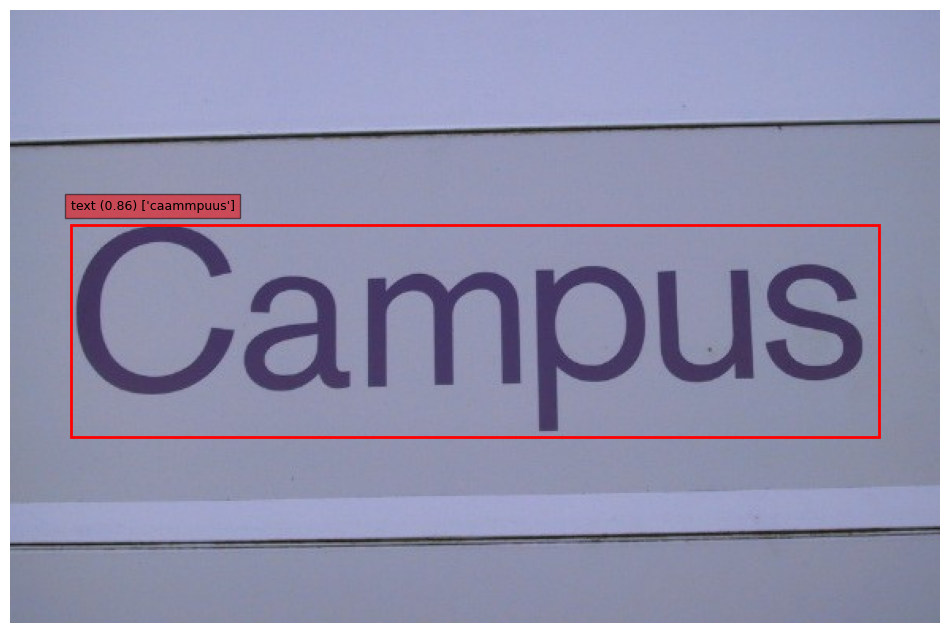

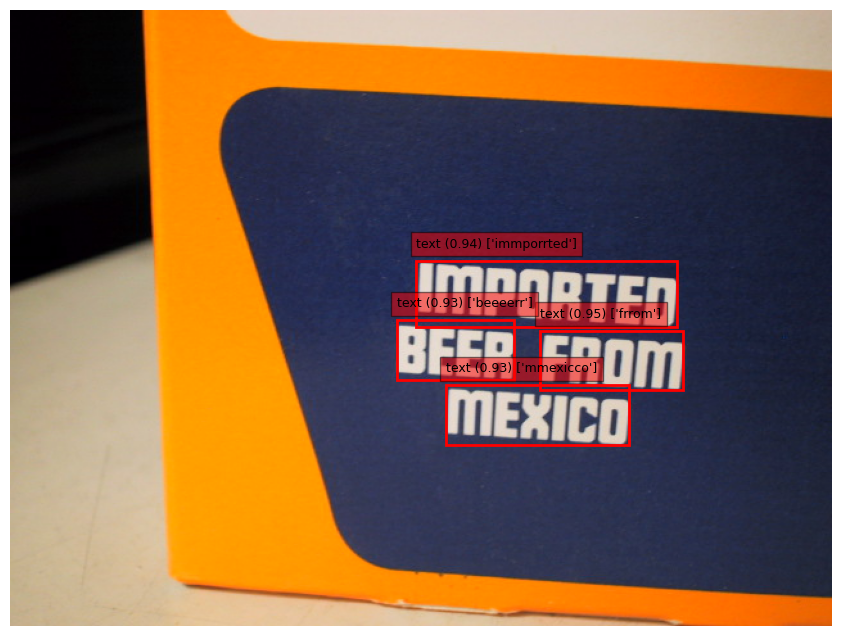

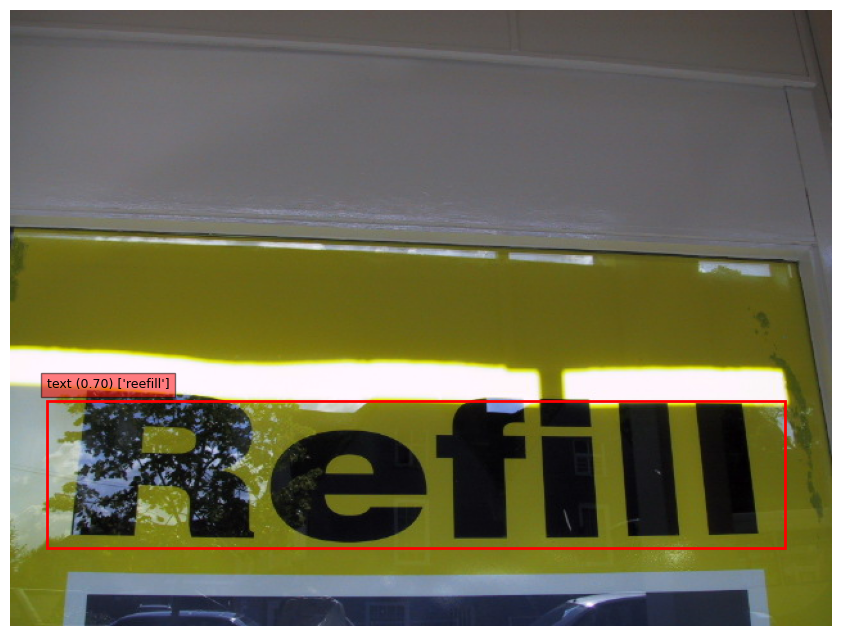

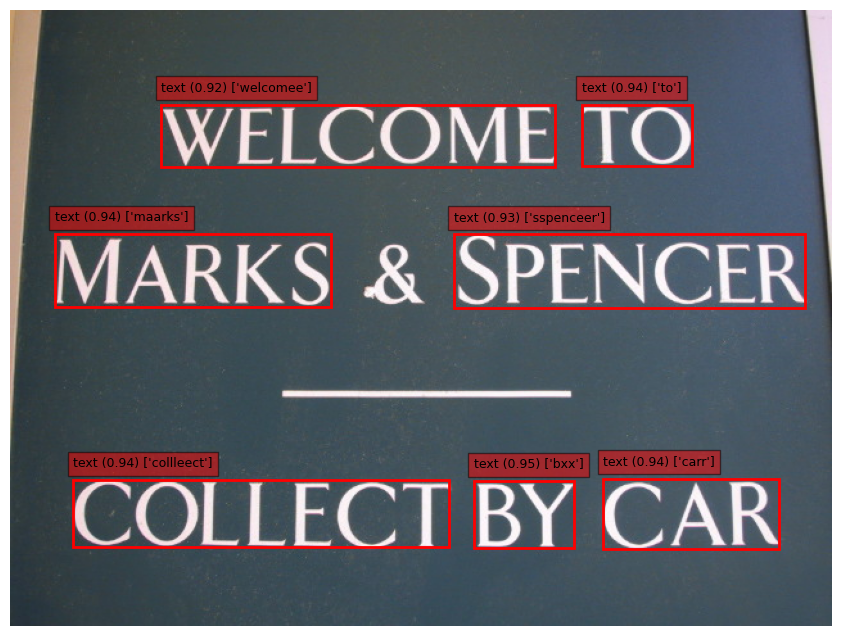

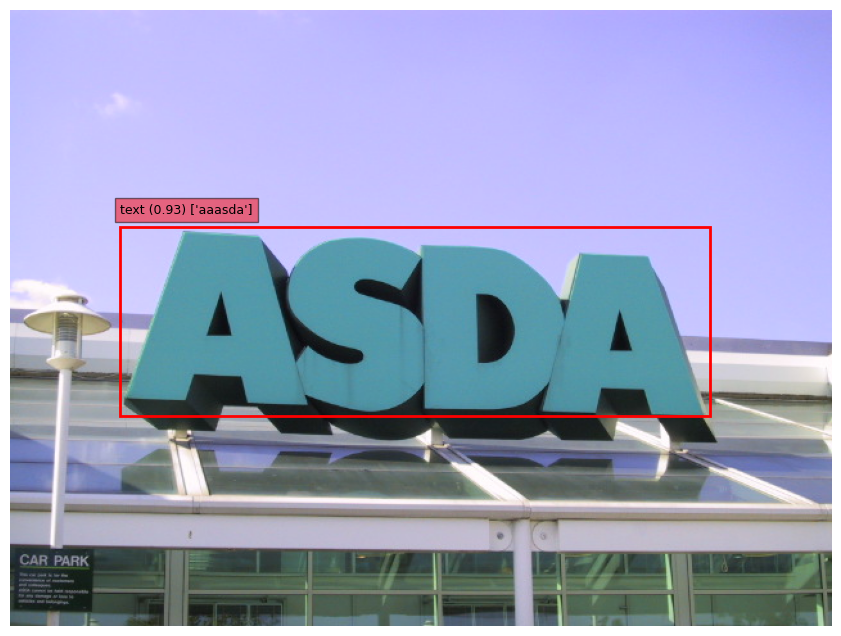

...

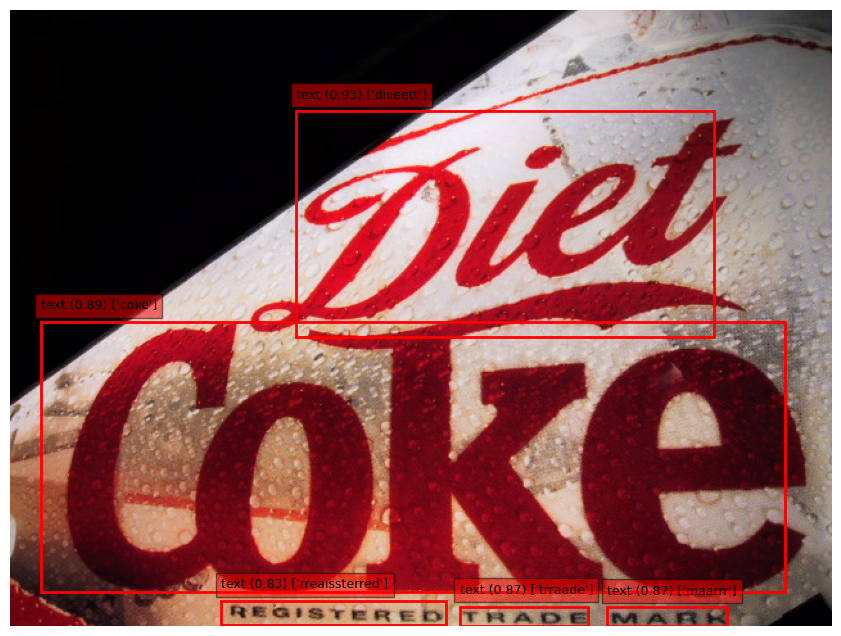

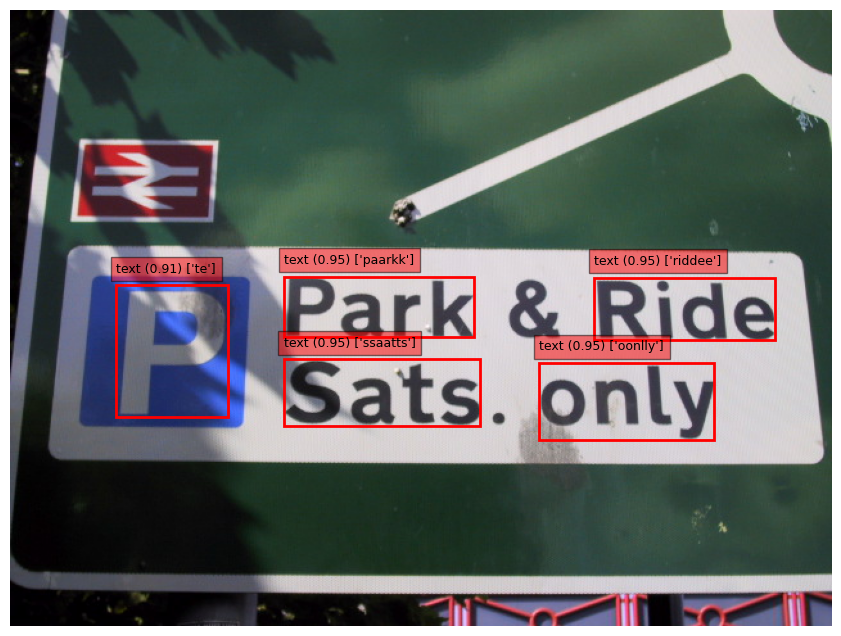

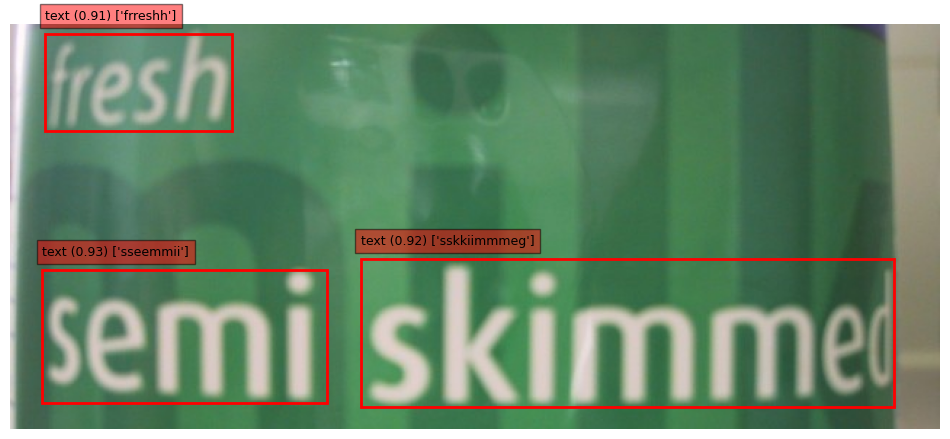

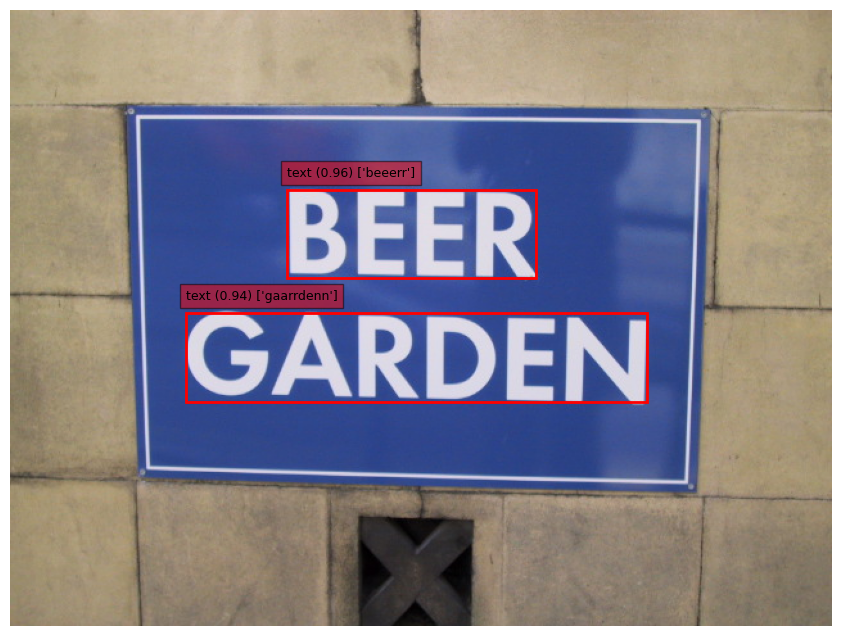

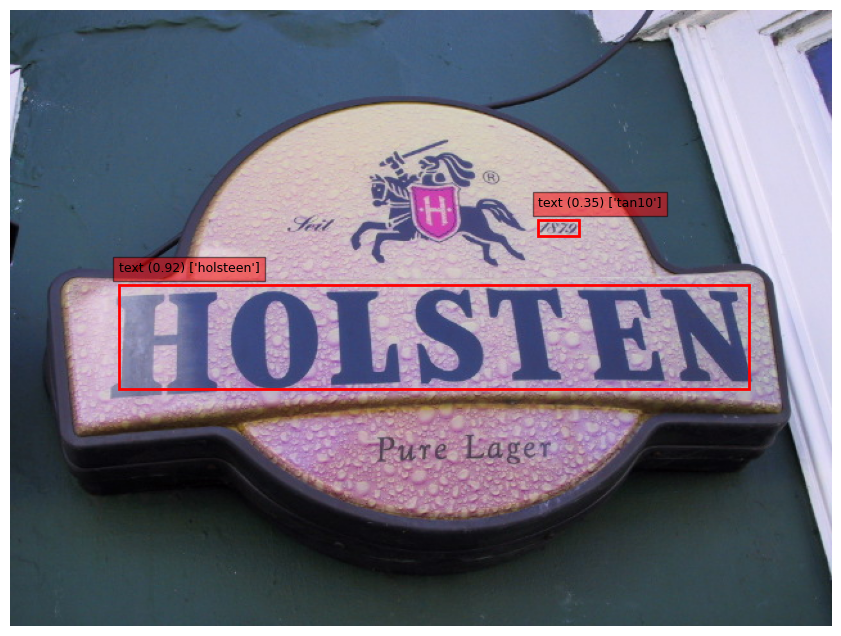

In [21]:
img_dir = '/content/SceneTrialTrain/lfsosa_12.08.2002'
inf_transforms = data_transforms['val']
for img_filename in os.listdir(img_dir)[:20]:
    img_path = os.path.join(img_dir, img_filename)
    predictions = predict(
        img_path,
        data_transforms=inf_transforms,
        text_det_model=yolo,
        text_reg_model=crnn_resnet_model,
        idx_to_char=idx_to_char,
        device=device,
        visualize=True
    )

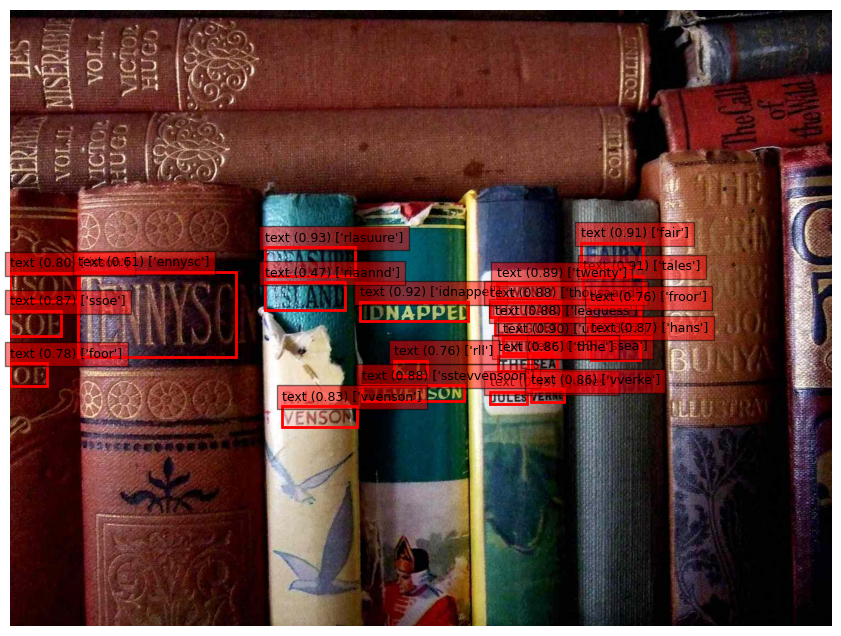

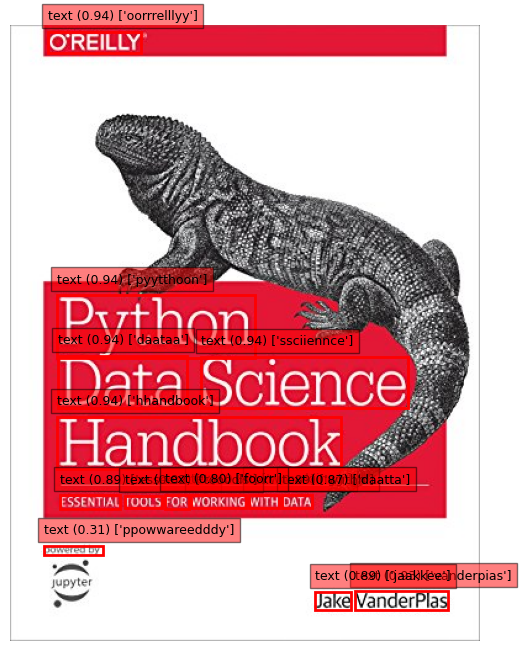

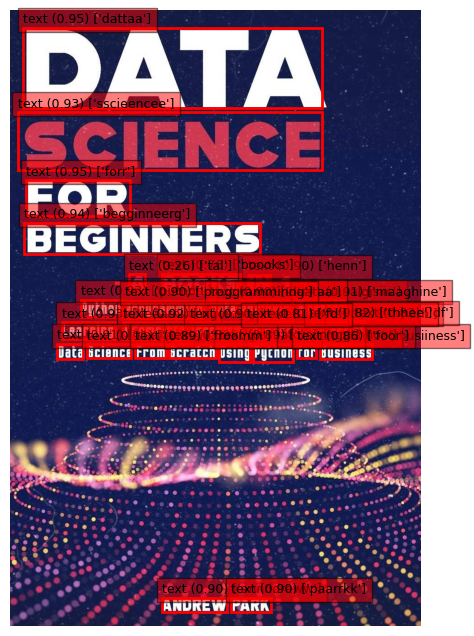

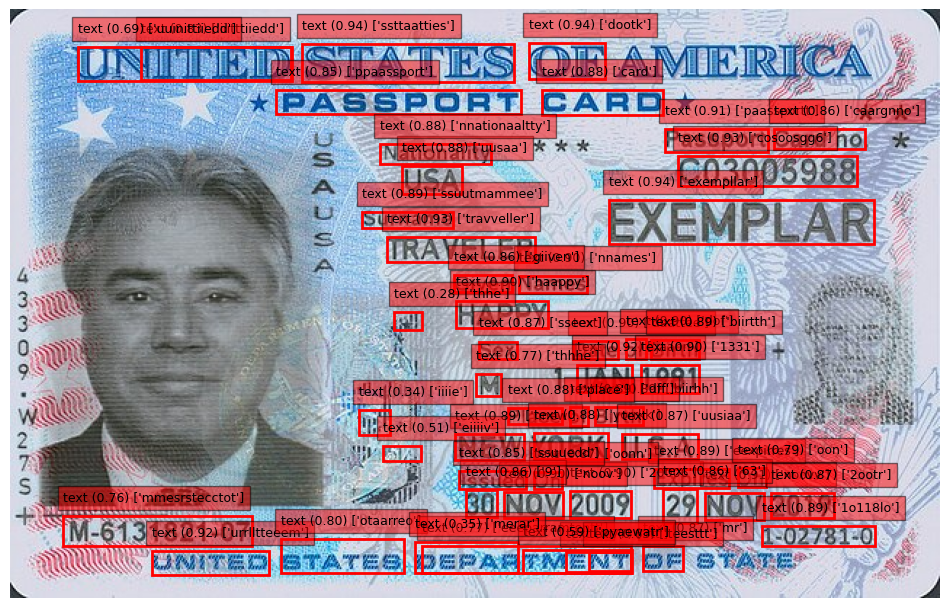

In [23]:
test_image_path_1 = "/content/3587804365_fa15d9f0e7_o-5c39394fc9e77c0001570010.jpeg"
test_image_path_2 = "/content/92270temp.jpeg"
test_image_path_3 = "/content/E9XYSgVo7y_beNGQtTR6EbK1ge7RbHZmRAaAc2yZU5HvfzryHCt1uSUfm6DBT5yCRosMFTI86p_Y99yQQLOekbN8iPRA3gmgnEZHB0erqleNtyI4w9bhrCkFgFjOghX1oEnnxeHD.jpeg"
test_image_path_4 = "/content/Passport_card.jpeg"

new_img_test_list = [test_image_path_1, test_image_path_2, test_image_path_3, test_image_path_4]

for img_filename in new_img_test_list:
    img_path = os.path.join(img_dir, img_filename)
    predictions = predict(
        img_path,
        data_transforms=inf_transforms,
        text_det_model=yolo,
        text_reg_model=crnn_resnet_model,
        idx_to_char=idx_to_char,
        device=device,
        visualize=True
    )